**Import Libraries**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.metrics import mean_squared_error, r2_score

sns.set()
import warnings
warnings.filterwarnings("ignore")


In [2]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None
# Set maximum number of rows/columns to display # if 10 is given instead of None it will show 10 rows/columns

**Load Data**

In [3]:
df = pd.read_csv('HousePrices.csv')
df.head()

,Id,Dwell_Type,Zone_Class,LotFrontage,LotArea,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,Property_Sale_Price
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
df.drop(columns = 'Id', inplace =True)

In [5]:
df.shape

(2073, 80)

In [6]:
df.describe()

,Dwell_Type,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,Property_Sale_Price
count,2073.000000,1753.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2059.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,1960.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000,2073.000000
mean,60.556199,72.056475,10717.853353,6.233478,5.835022,1969.445731,1986.617463,101.875668,437.949349,49.219489,565.101302,1052.270140,1166.096961,344.745779,6.168355,1517.011095,0.429329,0.056440,1.571635,0.378678,2.874096,1.052581,6.540280,0.602026,1980.418367,1.775687,474.683068,94.168837,46.035697,21.029908,2.979257,14.552340,2.299083,39.736614,6.287506,2007.851905,180967.284129
std,159.924810,27.987475,9215.982306,1.517115,1.360214,30.222647,20.432694,179.169217,448.051119,165.621465,449.730940,431.026436,376.975119,438.844748,49.553967,517.236428,0.522605,0.237015,0.545963,0.499873,0.816144,0.237901,1.629673,0.633931,24.158327,0.741976,212.284955,129.072113,64.768713,59.569928,26.817218,54.099626,37.411031,429.819512,2.690130,1.329705,78666.411112
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1906.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,60.000000,7620.000000,5.000000,5.000000,1950.000000,1970.000000,0.000000,0.000000,0.000000,208.000000,794.000000,894.000000,0.000000,0.000000,1126.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1963.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,130000.000000
50%,50.000000,70.000000,9492.000000,6.000000,5.000000,1971.000000,1995.000000,0.000000,381.000000,0.000000,466.000000,990.000000,1095.000000,0.000000,0.000000,1470.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1984.000000,2.000000,480.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163990.000000
75%,70.000000,83.000000,11601.000000,7.000000,7.000000,1999.000000,2004.000000,161.500000,708.000000,0.000000,804.000000,1291.000000,1391.000000,730.000000,0.000000,1792.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2003.000000,2.000000,576.000000,168.000000,67.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,7080.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2023.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2019.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [7]:
df.describe(include = 'object')

,Zone_Class,Road_Type,Alley,Property_Shape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,Dwelling_Type,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
count,2073,2073,129,2073,2073,2073,2073,2073,2073,2073,2073,2073,2073,2073,2073,2073,2073,2059,2073,2073,2073,2014,2014,2012,2014,2013,2073,2073,2073,2072,2073,2073,1085,1960,1960,1960,1960,2073,8,404,80,2073,2073
unique,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,5,6,3,5,5,3,3,4,4,9,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,Gd,MnPrv,Shed,WD,Normal
freq,1611,2063,72,1300,1854,2070,1481,1958,317,1794,2054,1719,1036,1606,2036,750,729,1233,1272,1815,928,904,1851,1349,604,1770,2025,1045,1935,1901,1043,1937,530,1252,857,1870,1885,1913,4,233,74,1797,1695


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2073 entries, 0 to 2072
Data columns (total 80 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Dwell_Type           2073 non-null   int64  
 1   Zone_Class           2073 non-null   object 
 2   LotFrontage          1753 non-null   float64
 3   LotArea              2073 non-null   int64  
 4   Road_Type            2073 non-null   object 
 5   Alley                129 non-null    object 
 6   Property_Shape       2073 non-null   object 
 7   LandContour          2073 non-null   object 
 8   Utilities            2073 non-null   object 
 9   LotConfig            2073 non-null   object 
 10  LandSlope            2073 non-null   object 
 11  Neighborhood         2073 non-null   object 
 12  Condition1           2073 non-null   object 
 13  Condition2           2073 non-null   object 
 14  Dwelling_Type        2073 non-null   object 
 15  HouseStyle           2073 non-null   o

**It seems like Dwell_Type, OverallQual, OverallCond are not in object data type. So, convert them to object dtype**

**data type conversion**

In [9]:
df['Dwell_Type'] = df['Dwell_Type'].astype('object')
df['OverallQual'] = df['OverallQual'].astype('object')
df['OverallCond'] = df['OverallCond'].astype('object')

**Missing Value Treatment**

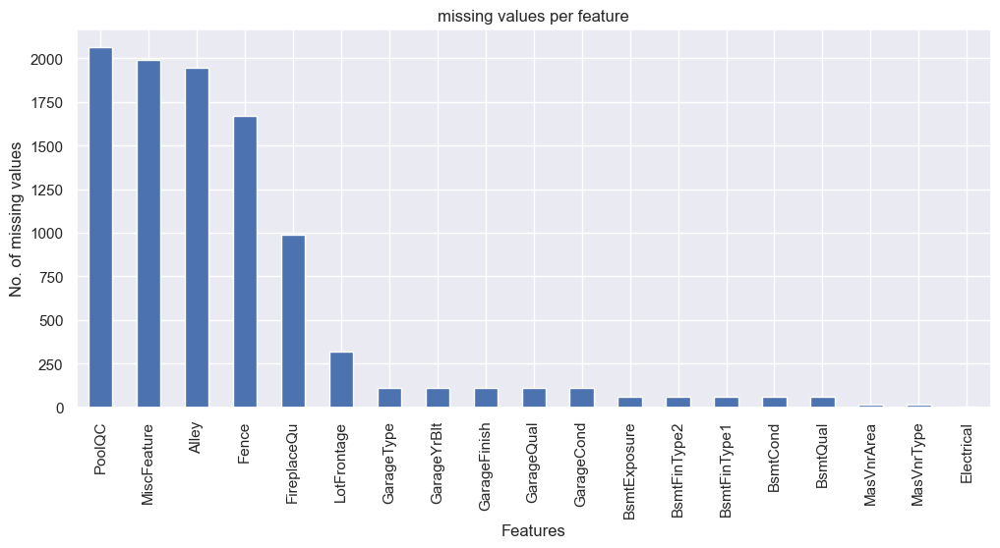

In [10]:
missing = df.isnull().sum()
missing = missing[missing>0]
missing.sort_values(ascending = False, inplace = True)
missing.plot(kind = 'bar', figsize=(12,5),
             title = 'missing values per feature',
             xlabel = 'Features', ylabel = 'No. of missing values')
plt.show()

There are few features which has more than 50% of its datas as null values. We could remove those features.

In [11]:
miss_half = missing[missing>len(df)/2]
df.drop(columns = miss_half.index, inplace = True)

In [12]:
df.shape

(2073, 76)

there were 4 columns with more than 50% null values

In [13]:
#Replacing null values of FireplaceQu with NA (NA: No Fireplace)
df['FireplaceQu'].fillna('NA', inplace = True)

#Replacing null values of LotFrontage with its mean
mean_LF = df['LotFrontage'].mean().round()
df['LotFrontage'].fillna(mean_LF, inplace = True)

#Replacing null values of GarageType, GarageYrBlt, GarageFinish, GarageQual, GarageCond with NG (NG: No Garage)
no_GA = (df['GarageArea'] == 0)
df.loc[no_GA, ['GarageType', 'GarageFinish', 'GarageQual', 'GarageCond']] = df.loc[no_GA, ['GarageType',
                             'GarageFinish', 'GarageQual', 'GarageCond']].fillna('NG')

#Replacing null values of BsmtExposure, BsmtFinType2, BsmtFinType1, BsmtCond, BsmtQual with NB (NB: No Basement)
no_BA = df['TotalBsmtSF'] == 0
df.loc[no_BA, ['BsmtExposure', 'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'BsmtQual']] = df.loc[no_BA, ['BsmtExposure',
                                               'BsmtFinType2', 'BsmtFinType1', 'BsmtCond', 'BsmtQual']].fillna('NB')

In [14]:
#sns.distplot(df['GarageYrBlt'], kde=True)
#print(f"Median is {(df['GarageYrBlt']).median()}")

In [15]:
df.drop(columns = 'GarageYrBlt', inplace = True)

In [16]:
#droping rows which has null values in it
df.dropna(inplace = True)

In [17]:
df.reset_index(drop = True, inplace = True)
df.shape

(2055, 75)

**Distribution of Dependent Variable**

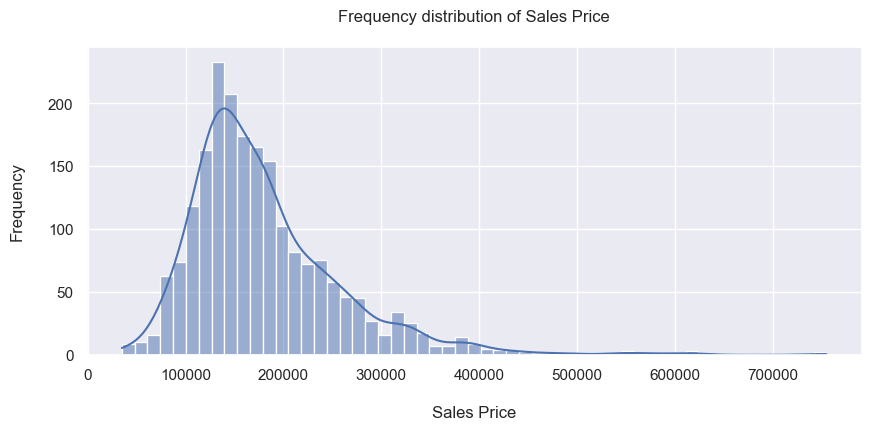

Skeness is 1.8410664817405393


In [18]:
plt.figure(figsize = (10,4))
plt.title('Frequency distribution of Sales Price\n')
sns.histplot(data = df, x = 'Property_Sale_Price', kde = True)
plt.xlabel('\nSales Price')
plt.ylabel('Frequency\n')
plt.show()

print(f"Skeness is {stats.skew(df['Property_Sale_Price'])}")

From the graph it is clear that dependent variable is right skewed. So we need to do transformation on dependent variable.

Skewness of log transformed data is: 0.07538916027606103
Skewness of sqrt transformed data is: 0.9090677946114248
Skewness of cbrt transformed data is: 0.6313910662139905
Skewness of boxcox transformation is: -0.005739699611782247


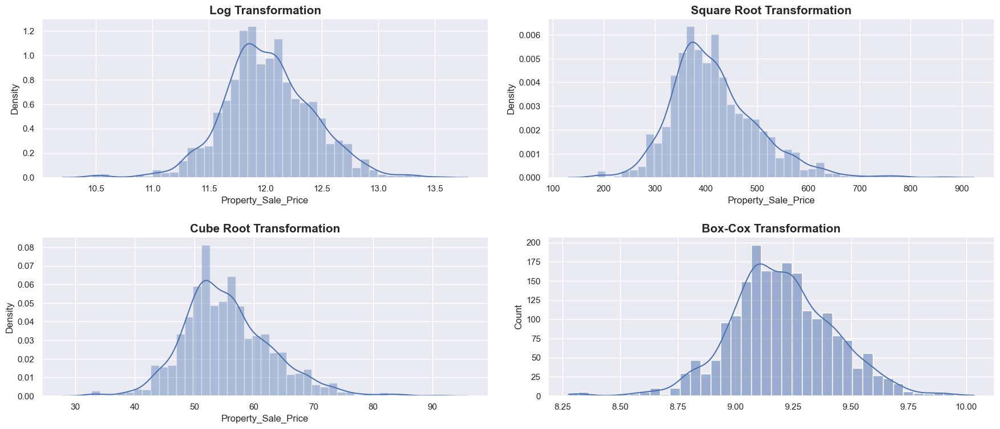

In [19]:
fig,((ax1,ax2),(ax3,ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize = [18,8])

# Plot 1: log transformation
sns.distplot(np.log(df['Property_Sale_Price']), kde=True, ax=ax1)
ax1.set_title('Log Transformation', fontsize = 15, fontweight='bold')

# Plot 2: square root transformation
sns.distplot(np.sqrt(df['Property_Sale_Price']), kde=True, ax=ax2)
ax2.set_title('Square Root Transformation', fontsize = 15, fontweight='bold')

# Plot 3: cube root transformation
sns.distplot(np.cbrt(df['Property_Sale_Price']), kde=True, ax=ax3)
ax3.set_title('Cube Root Transformation', fontsize = 15, fontweight='bold')

#Plot 4: Box-Cox transformation
sns.histplot(stats.boxcox(df['Property_Sale_Price'])[0], kde=True, ax=ax4)
ax4.set_title('Box-Cox Transformation', fontsize = 15, fontweight='bold')

print(f"Skewness of log transformed data is: {stats.skew(np.log(df['Property_Sale_Price']))}")
print(f"Skewness of sqrt transformed data is: {stats.skew(np.sqrt(df['Property_Sale_Price']))}")
print(f"Skewness of cbrt transformed data is: {stats.skew(np.cbrt(df['Property_Sale_Price']))}")
print(f"Skewness of boxcox transformation is: {stats.skew(stats.boxcox(df['Property_Sale_Price'])[0])}")

fig.tight_layout(pad = 2)
plt.show()

here we will use boxcox transformation

In [20]:
#Transforming the Dependent Varaiable
df['Property_Sale_Price'] = stats.boxcox(df['Property_Sale_Price'])[0]

In [21]:
#Splitting into Numerical and Categorical Features
num_features = df.select_dtypes(exclude = ['object']).columns
print(f"Number of numerical features are: {len(num_features)}")
print(num_features)
print('\n')
cat_features = df.select_dtypes(include = ['object']).columns
print(f"Number of categorical features are: {len(cat_features)}")
print(cat_features)

Number of numerical features are: 33
Index(['LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF',
       '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath',
       'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'YrSold', 'Property_Sale_Price'],
      dtype='object')


Number of categorical features are: 42
Index(['Dwell_Type', 'Zone_Class', 'Road_Type', 'Property_Shape',
       'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood',
       'Condition1', 'Condition2', 'Dwelling_Type', 'HouseStyle',
       'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'Bsmt

In [22]:
#pairwise scatterplot for numerical features
sns.pairplot(data = df[num_features])

<AxesSubplot: >

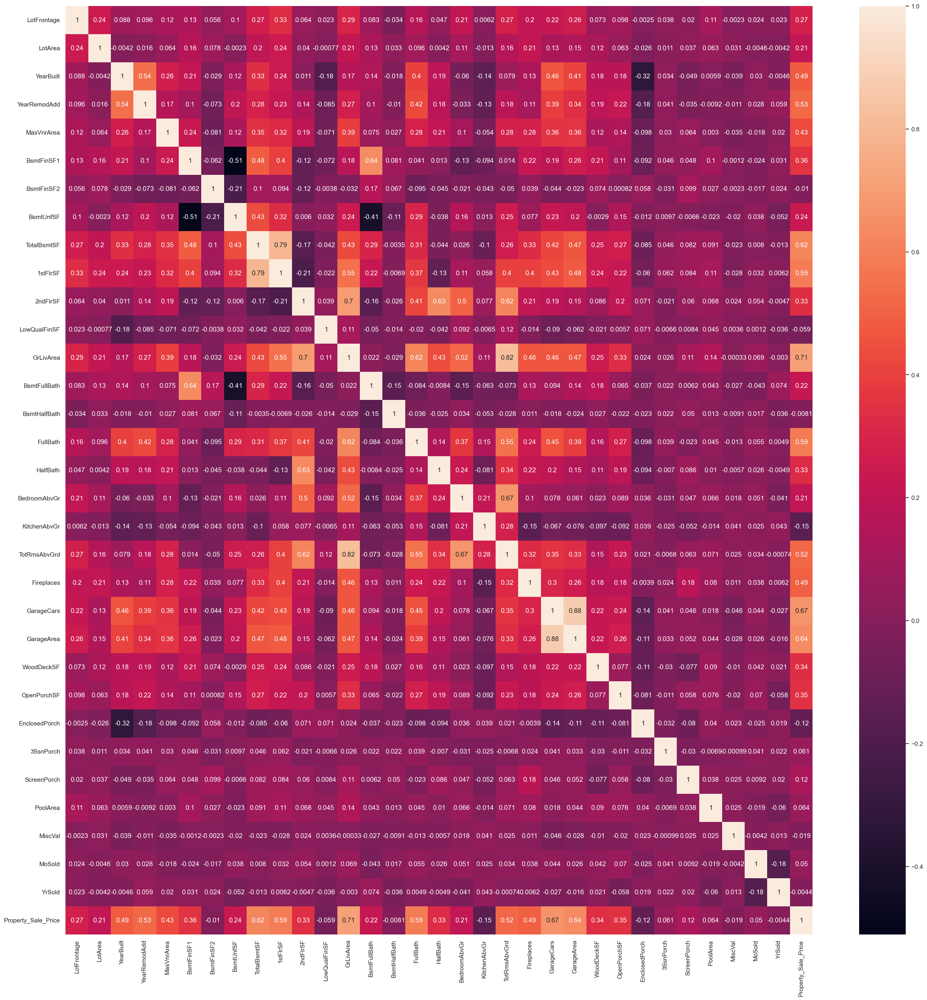

In [23]:
#correlation matrix
plt.figure(figsize = (30,30))
sns.heatmap(data = df[num_features].corr(), annot = True)

In [23]:
num_features = num_features.drop(['Property_Sale_Price'])

**Feature Engineering**

In [24]:
def cat_corr(df,x,y):
    
    cat_corr_df = pd.DataFrame(columns = ['Features', 'Statistic value', 'p-value', 'Significant'])
    
    for feature in x:
        cat_list = df[[feature,y]].groupby(feature)[y].apply(list)
        f,p = stats.f_oneway(*cat_list)
        #Null hypothesis: There is no correlation between predictor and dependent variable
        #Alternate hypothesis: There is significant correlation between predictor and dependent varaible
        if p < 0.05:
            #rejecting the null hypothessis
            cat_corr_df = cat_corr_df.append({'Features': feature, 'Statistic value': f, 'p-value': p, 'Significant': 'Yes'}, ignore_index=True)
        else:
            #Accepting the null hypothesis
            cat_corr_df = cat_corr_df.append({'Features': feature, 'Statistic value': f, 'p-value': p, 'Significant': 'No'}, ignore_index=True)
   
    cat_corr_df = cat_corr_df.sort_values(by = 'p-value', ascending = True)
    return cat_corr_df

In [25]:
cat_corr(df,cat_features,'Property_Sale_Price')

,Features,Statistic value,p-value,Significant
8,Neighborhood,110.365907,0.000000e+00,Yes
20,ExterQual,577.664605,4.182021e-272,Yes
32,KitchenQual,555.360508,3.652869e-264,Yes
23,BsmtQual,414.562520,6.480652e-262,Yes
36,GarageFinish,426.799701,2.079313e-215,Yes
35,GarageType,173.621117,7.978071e-179,Yes
13,OverallQual,116.290399,1.984107e-176,Yes
34,FireplaceQu,182.204203,9.118516e-161,Yes
22,Foundation,179.314799,1.347836e-158,Yes
29,HeatingQC,161.314793,3.747880e-120,Yes


In [26]:
new_cat_features = cat_features.drop(['Utilities', 'LandSlope'])
new_cat_features = list(new_cat_features)

**Assumptions of Linear Regression**

=>*Linearity*

In [27]:
def linearity(data,x,y):
    
    num_corr_df = pd.DataFrame(columns = ['Features', 'corr-coeff', 'p-value', 'Significant'])
    
    for feature in x:
        r,p = stats.pearsonr(data[feature],data[y])
        #Null hypothesis: There is no correlation between predictor and response variable
        #Alternate hypothesis: There is significant correlation with predictor and response variable
        if p < 0.05:
            #Accepting the null hypothesis
            num_corr_df = num_corr_df.append({'Features': feature, 'corr-coeff': r, 'p-value': p, 'Significant': 'Yes'}, ignore_index=True)
        else:
            #Rejecting the null hypothesis
            num_corr_df = num_corr_df.append({'Features': feature, 'corr-coeff': r, 'p-value': p, 'Significant': 'No'}, ignore_index=True)
    num_corr_df = num_corr_df.sort_values(by = ['p-value'], ascending = True)
    return num_corr_df

In [28]:
linearity(df,num_features,'Property_Sale_Price')

,Features,corr-coeff,p-value,Significant
12,GrLivArea,0.706172,3.679265e-310,Yes
21,GarageCars,0.667070,8.954600e-265,Yes
22,GarageArea,0.639560,8.843094e-237,Yes
8,TotalBsmtSF,0.617681,1.752839e-216,Yes
9,1stFlrSF,0.590866,1.073543e-193,Yes
15,FullBath,0.585993,8.814425e-190,Yes
3,YearRemodAdd,0.525107,5.104040e-146,Yes
19,TotRmsAbvGrd,0.521080,1.981318e-143,Yes
20,Fireplaces,0.492719,3.791317e-126,Yes
2,YearBuilt,0.486034,2.628994e-122,Yes


In [29]:
num_features = num_features.drop(['MiscVal', 'BsmtFinSF2', 'BsmtHalfBath', 'YrSold'])
num_features.shape

(28,)

Now every features follows linearity

=>*Multicolinearity*

<AxesSubplot: >

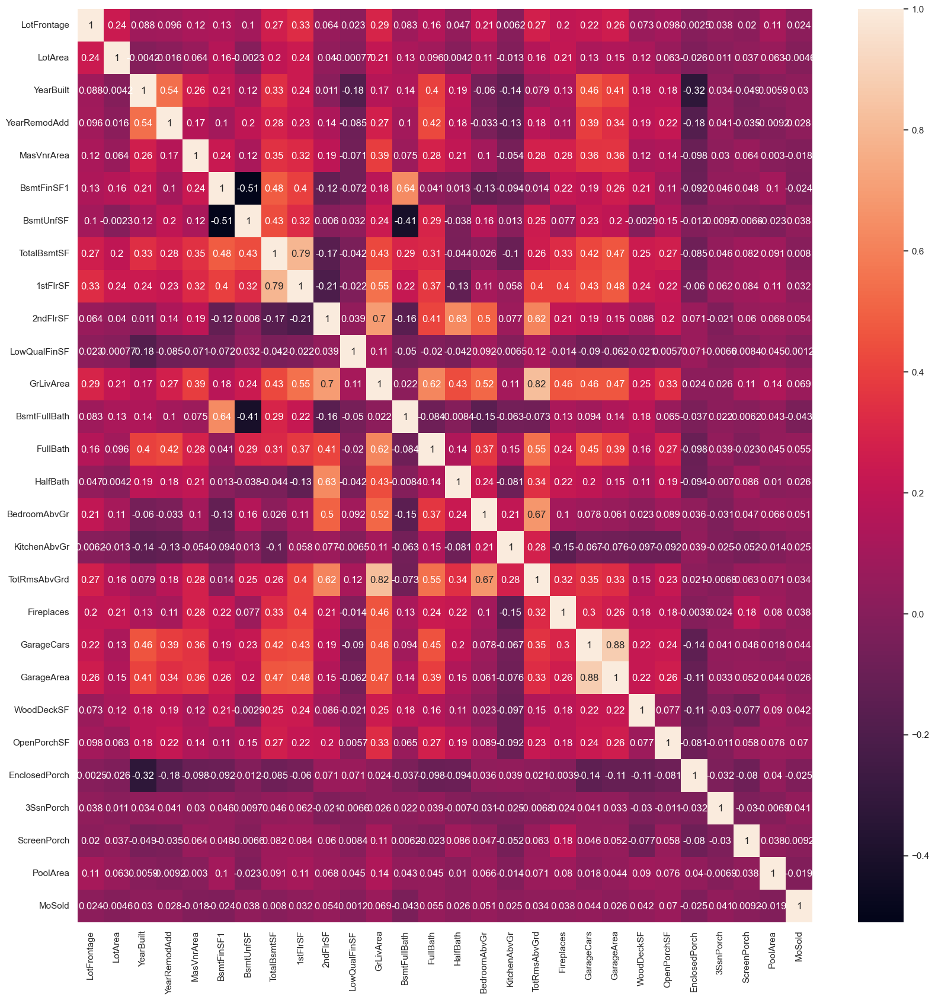

In [156]:
plt.figure(figsize = (20,20))
sns.heatmap(df[num_features].corr(), annot = True)

<AxesSubplot: >

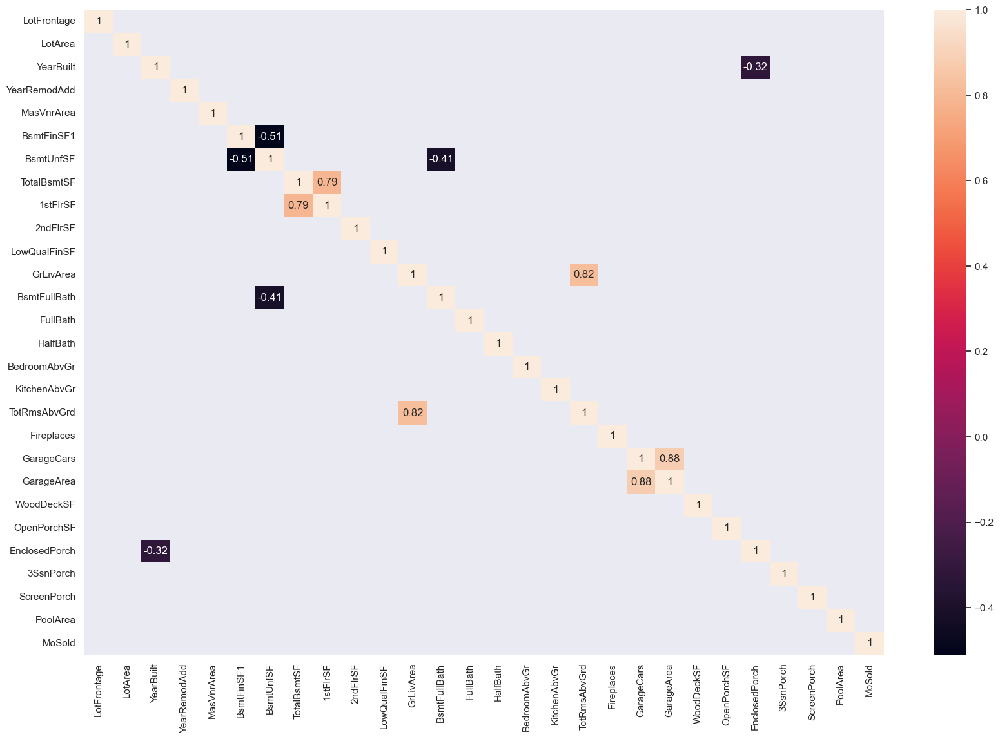

In [98]:
plt.figure(figsize = (20,13))
corr = df[num_features].corr()
sns.heatmap(corr[(corr>=0.75)|(corr<=-0.25)], annot = True)

In [30]:
#Removing some features because it is clear from the graph that they have high multicolinearity
num_features = num_features.drop(['1stFlrSF', 'GrLivArea', 'GarageCars', 'BsmtFinSF1', 'BsmtUnfSF', 'YearBuilt'])

In [31]:
v = df[num_features]
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
12,TotRmsAbvGrd,63.036160
2,YearRemodAdd,48.234824
10,BedroomAbvGr,27.809146
11,KitchenAbvGr,26.468104
8,FullBath,17.404937
4,TotalBsmtSF,15.404012
0,LotFrontage,10.754830
14,GarageArea,9.526478
21,MoSold,6.629409
5,2ndFlrSF,5.704335


def vif_df(df, num_features, col_to_drop):
    
    v = df[num_features].drop(columns=col_to_drop)
    vif_data = pd.DataFrame()
    
    vif_data['Feature'] = v.columns
    vif_data['VIF'] = [vif(v.values, i) for i in range(len(v.columns))]
    
    vif_data = vif_data.sort_values(by=['VIF'], ascending=False)
    return vif_data

In [32]:
v = df[num_features].drop(columns = ['TotRmsAbvGrd'])
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
2,YearRemodAdd,47.761408
11,KitchenAbvGr,23.314612
10,BedroomAbvGr,21.031408
8,FullBath,17.163911
4,TotalBsmtSF,14.317116
0,LotFrontage,10.675072
13,GarageArea,9.323083
20,MoSold,6.611079
5,2ndFlrSF,4.914297
9,HalfBath,3.054034


In [33]:
v = df[num_features].drop(columns = ['TotRmsAbvGrd', 'YearRemodAdd'])
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
9,BedroomAbvGr,19.085479
7,FullBath,16.758869
10,KitchenAbvGr,15.918902
3,TotalBsmtSF,14.122224
0,LotFrontage,10.287557
12,GarageArea,9.094110
19,MoSold,6.022305
4,2ndFlrSF,4.678167
8,HalfBath,2.929327
1,LotArea,2.654855


In [34]:
v = df[num_features].drop(columns = ['TotRmsAbvGrd', 'YearRemodAdd', 'BedroomAbvGr'])
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
7,FullBath,16.191426
3,TotalBsmtSF,13.731299
9,KitchenAbvGr,12.967220
0,LotFrontage,9.643969
11,GarageArea,9.040883
18,MoSold,5.929705
4,2ndFlrSF,4.224504
8,HalfBath,2.928280
1,LotArea,2.641399
10,Fireplaces,2.582848


In [35]:
v = df[num_features].drop(columns = ['TotRmsAbvGrd', 'YearRemodAdd', 'BedroomAbvGr', 'FullBath'])
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
3,TotalBsmtSF,12.265984
8,KitchenAbvGr,10.726459
0,LotFrontage,9.616121
10,GarageArea,8.678606
17,MoSold,5.901139
4,2ndFlrSF,3.428758
7,HalfBath,2.797000
1,LotArea,2.640821
9,Fireplaces,2.563724
6,BsmtFullBath,1.927552


In [36]:
v = df[num_features].drop(columns = ['TotRmsAbvGrd', 'YearRemodAdd', 'BedroomAbvGr', 'FullBath', 'TotalBsmtSF'])
vif_data = pd.DataFrame()

vif_data['Feature'] = v.columns
vif_data['VIF'] = [vif(v.values,i) for i in range(len(v.columns))]

vif_data = vif_data.sort_values(by = ['VIF'], ascending = False)
vif_data

,Feature,VIF
7,KitchenAbvGr,9.960128
0,LotFrontage,9.216971
9,GarageArea,7.539616
16,MoSold,5.860994
3,2ndFlrSF,3.091830
6,HalfBath,2.795322
1,LotArea,2.623818
8,Fireplaces,2.467722
5,BsmtFullBath,1.874606
10,WoodDeckSF,1.755663


In [37]:
new_num_features = list(vif_data['Feature'])

In [38]:
new_num_features

['KitchenAbvGr',
 'LotFrontage',
 'GarageArea',
 'MoSold',
 '2ndFlrSF',
 'HalfBath',
 'LotArea',
 'Fireplaces',
 'BsmtFullBath',
 'WoodDeckSF',
 'OpenPorchSF',
 'MasVnrArea',
 'EnclosedPorch',
 'ScreenPorch',
 'PoolArea',
 'LowQualFinSF',
 '3SsnPorch']

In [39]:
#Encoding Categorical Variables
le = LabelEncoder()
df[new_cat_features] = df[new_cat_features].apply(lambda col: le.fit_transform(col))

In [40]:
new_cat_features

['Dwell_Type',
 'Zone_Class',
 'Road_Type',
 'Property_Shape',
 'LandContour',
 'LotConfig',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'Dwelling_Type',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

In [41]:
features = new_num_features + new_cat_features + ['Property_Sale_Price']
data = df[features]
data.shape

(2055, 58)

**Train Test Split**

In [42]:
x = data.drop(columns = ['Property_Sale_Price'])
y = data['Property_Sale_Price']

In [43]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 123)

In [44]:
def shape(x):
    return x.shape

In [45]:
shape(x_train)

(1438, 57)

In [46]:
shape(y_train)

(1438,)

In [47]:
shape(x_test)

(617, 57)

In [48]:
shape(y_test)

(617,)

#encoding
for col in x_train.drop(columns = new_num_features).columns:
    le = LabelEncoder()
    x_train[col] = le.fit_transform(x_train[col])
    x_test[col] = le.transform(x_test[col])

**Linear Regression using OLS method**

In [49]:
x1 = sm.add_constant(x_train)
model = sm.OLS(y_train,x1).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     Property_Sale_Price   R-squared:                       0.817
Model:                             OLS   Adj. R-squared:                  0.810
Method:                  Least Squares   F-statistic:                     108.1
Date:                 Sat, 25 Mar 2023   Prob (F-statistic):               0.00
Time:                         19:43:33   Log-Likelihood:                 1327.3
No. Observations:                 1438   AIC:                            -2539.
Df Residuals:                     1380   BIC:                            -2233.
Df Model:                           57                                         
Covariance Type:             nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              8.6975      0.067    129.054      0.000       8.565       8.830
KitchenAbvGr       0.0428      0.013      3.269      0.001       0.017       0.068
LotFrontage        0.0001      0.000      1.103      0.270   -9.71e-05       0.000
GarageArea         0.0002   1.75e-05     10.566      0.000       0.000       0.000
MoSold             0.0009      0.001      0.952      0.342      -0.001       0.003
2ndFlrSF           0.0001   1.02e-05     11.129      0.000    9.38e-05       0.000
HalfBath          -0.0088      0.007     -1.187      0.236      -0.023       0.006
LotArea         8.821e-07   2.82e-07      3.133      0.002     3.3e-07    1.43e-06
Fireplaces         0.0492      0.005      9.758      0.000       0.039       0.059
BsmtFullBath       0.0341      0.006      5.568      0.000       0.022       0.046
WoodDeckSF         0.0001   2.31e-05      5.536      0.000    8.25e-05       0.000
OpenPorchSF        0.0002    4.4e-05      3.675      0.000    7.55e-05       0.000
MasVnrArea      6.158e-05   1.78e-05      3.460      0.001    2.67e-05    9.65e-05
EnclosedPorch   1.804e-05   4.78e-05      0.377      0.706   -7.58e-05       0.000
ScreenPorch        0.0002   5.09e-05      4.362      0.000       0.000       0.000
PoolArea       -1.949e-05   6.09e-05     -0.320      0.749      -0.000       0.000
LowQualFinSF    6.786e-05   5.27e-05      1.289      0.198   -3.54e-05       0.000
3SsnPorch          0.0002      0.000      1.698      0.090   -2.75e-05       0.000
Dwell_Type        -0.0019      0.001     -1.509      0.132      -0.004       0.001
Zone_Class        -0.0144      0.005     -3.087      0.002      -0.024      -0.005
Road_Type          0.1698      0.039      4.408      0.000       0.094       0.245
Property_Shape    -0.0072      0.002     -3.530      0.000      -0.011      -0.003
LandContour        0.0026      0.004      0.680      0.497      -0.005       0.010
LotConfig         -0.0006      0.002     -0.364      0.716      -0.004       0.003
Neighborhood       0.0008      0.000      1.629      0.104      -0.000       0.002
Condition1         0.0065      0.003      2.075      0.038       0.000       0.013
Condition2        -0.0267      0.011     -2.356      0.019      -0.049      -0.004
Dwelling_Type     -0.0055      0.004     -1.430      0.153      -0.013       0.002
HouseStyle        -0.0053      0.002     -2.734      0.006      -0.009      -0.001
OverallQual        0.0131      0.002      6.033      0.000       0.009       0.017
OverallCond        0.0092      0.002      4.490      0.000       0.005       0.013
RoofStyle          0.0122      0.003      3.756      0.000       0.006       0.019
RoofMatl           0.0190      0.004      4.366      0.000       0.010       0.028
Exterior1st       -0.0036      0.002     -2.297      0.022      -0.007      -0.001
E

In [50]:
y_train_predict = model.predict(sm.add_constant(x_train))
y_test_predict = model.predict(sm.add_constant(x_test))
print(f'Train mean squared rrror : {np.sqrt(mean_squared_error(y_train,y_train_predict))}')
print(f'Test mean squared error : {np.sqrt(mean_squared_error(y_test,y_test_predict))}')

Train mean squared rrror : 0.09614026806920195
Test mean squared error : 0.10408116556659738


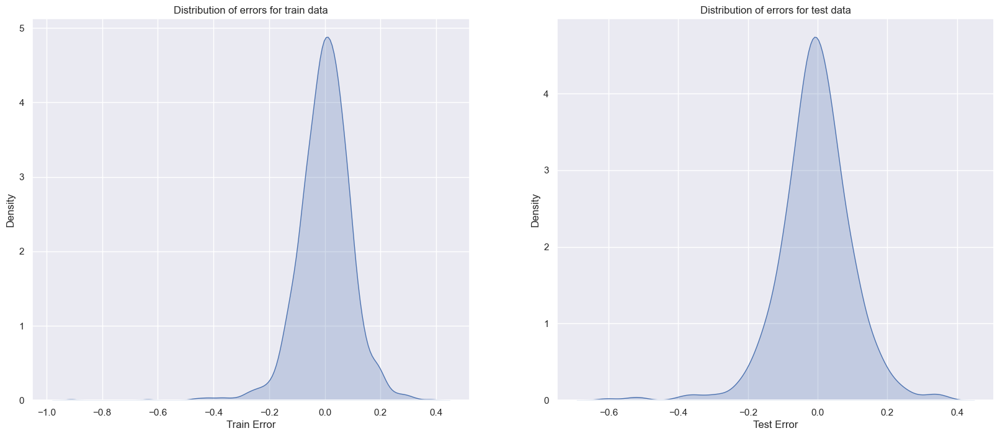

In [51]:
train_error = pd.DataFrame(columns = ['Actual','Predict','Error'])
train_error['Actual'] = y_train
train_error['Predict'] = y_train_predict
train_error['Error'] = train_error['Actual'] - train_error['Predict']

test_error = pd.DataFrame(columns = ['Actual','Predict','Error'])
test_error['Actual'] = y_test
test_error['Predict'] = y_test_predict
test_error['Error'] = test_error['Actual'] - test_error['Predict']

fig,(ax1,ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20,8))
sns.kdeplot(data = train_error, x = 'Error', fill = True, ax = ax1)
ax1.set_xlabel('Train Error')
ax1.set_title('Distribution of errors for train data')

sns.kdeplot(data = test_error, x = 'Error', fill = True, ax = ax2)
ax2.set_xlabel('Test Error')
ax2.set_title('Distribution of errors for test data')
plt.show()

In [52]:
def normality(x):
    s,p = stats.shapiro(x)
    # Null Hypothesis : Data is normally distributed
    # ALternate Hypothesis : Data is not normally distributed
    print(f'The Statistic value is {s} with a p-value {p}')
    if p < 0.05:
        # Rejecting null hypothesis
        print(f'{x.name} is not normally distributed.')
    else:
        # Accepting null hypothesis
        print(f'{x.name} is normally distributed.')

In [53]:
normality(train_error['Error'])

The Statistic value is 0.9371139407157898 with a p-value 3.442040337624914e-24
Error is not normally distributed.


In [54]:
normality(test_error['Error'])

The Statistic value is 0.947729229927063 with a p-value 5.987957119079138e-14
Error is not normally distributed.


In [61]:
y_actual = data['Property_Sale_Price']
y_pred = model.predict(sm.add_constant(x))

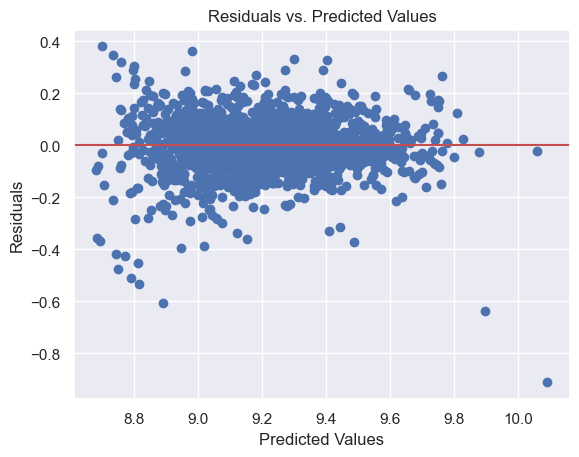

In [62]:
# assume y_pred and y_actual are arrays of predicted and actual values, respectively
residuals = y_actual - y_pred

# create a scatter plot of residuals vs. predicted values
fig, ax = plt.subplots()
ax.scatter(y_pred, residuals)
ax.axhline(y=0, color='r', linestyle='-') # add a horizontal line at y=0
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Residuals')
ax.set_title('Residuals vs. Predicted Values')
plt.show()